In [1]:
# imports
import cv2
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import glob
import matplotlib.image as mpimg
import time

# various classifiers
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier

from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
from sklearn.model_selection import train_test_split
from sklearn.externals import joblib

In [2]:
# class to extract features from an image
class FeatureExtractor:
    def __init__(
        self,
        image,
        image_size=(64, 64),
        color_space='YCrCb',
        hog_orientations=8,
        hog_pixels_per_cell=8,
        hog_cells_per_block=2,
        hog_channel_indexes=[0, 1, 2],
        spatial_feature_size=(16, 16),
        color_histogram_bins=32,
        hog_features=None,
        resized_image=None,
        color_converted_image=None
    ):
        self.image = image
        self.image_size = image_size
        self.color_space = color_space
        self.hog_orientations = hog_orientations
        self.hog_pixels_per_cell = hog_pixels_per_cell
        self.hog_cells_per_block = hog_cells_per_block
        self.hog_channel_indexes = hog_channel_indexes
        self.spatial_feature_size = spatial_feature_size
        self.color_histogram_bins = color_histogram_bins
        self.memoized_hog_features = hog_features
        self.memoized_resized_image = resized_image
        self.feature_image = color_converted_image

    def resized_image(self):
        if self.memoized_resized_image is None:
            self.memoized_resized_image = cv2.resize(self.image, self.image_size)
            
        return self.memoized_resized_image
        
    def color_converted_image(self):
        if self.feature_image is None:
            if self.color_space != 'RGB':
                self.feature_image = cv2.cvtColor(self.resized_image(), self.__color_mappings[self.color_space])
            else:
                self.feature_image = self.resized_image()

        return self.feature_image
    
    def hog_features(self):
        if self.memoized_hog_features is None:
            self.memoized_hog_features = []
            base_image = self.color_converted_image()
            for channel_index in self.hog_channel_indexes:
                channel = base_image[:, :, channel_index]
                self.memoized_hog_features.append(self.hog_features_for_channel(channel).ravel())
        
            self.memoized_hog_features = np.concatenate(self.memoized_hog_features)
            
        return self.memoized_hog_features
    
    def hog_features_for_channel(self, channel):
        return hog(
            channel,
            orientations=self.hog_orientations, 
            pixels_per_cell=(self.hog_pixels_per_cell, self.hog_pixels_per_cell),
            cells_per_block=(self.hog_cells_per_block, self.hog_cells_per_block),
            transform_sqrt=False, 
            visualise=False,
            feature_vector=False)
    
    def spatial_features(self):
        resized = cv2.resize(self.color_converted_image(), self.spatial_feature_size)
        flattened_channels = [resized[:, :, channel_index].ravel() for channel_index in range(3)]
        return np.concatenate(flattened_channels)
    
    def color_histogram_features(self):
        # Compute the histogram of the color channels separately
        channel = lambda channel_index: self.color_converted_image()[:, :, channel_index]
        histogram_for_channel = lambda channel_index: np.histogram(channel(channel_index), bins=self.color_histogram_bins)[0]
        channel_histograms = [histogram_for_channel(channel_index) for channel_index in range(3)]
        hist_features = np.concatenate(channel_histograms)
        return hist_features
    
    def combined_features(self):
        features = np.concatenate([self.hog_features(), self.spatial_features(), self.color_histogram_features()])
        
        return features
    
    __color_mappings = {
        'HSV': cv2.COLOR_RGB2HSV,
        'LUV': cv2.COLOR_RGB2LUV,
        'HLS': cv2.COLOR_RGB2HLS,
        'YUV': cv2.COLOR_RGB2YUV,
        'YCrCb': cv2.COLOR_RGB2YCrCb
    }

In [3]:
# train a model on the training data

cars = glob.glob('./vehicles/**/*.png', recursive=True)
not_cars = glob.glob('./non-vehicles/**/*.png', recursive=True)

print("There are {} cars and {} non-cars".format(len(cars), len(not_cars)))

t=time.time()
print('Extracting features')
car_features = [FeatureExtractor(mpimg.imread(filename)).combined_features() for filename in cars]
not_car_features = [FeatureExtractor(mpimg.imread(filename)).combined_features() for filename in not_cars]
t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract features')

X = np.vstack((car_features, not_car_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(not_car_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

# Use a SVC for the classifier
svc = SVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)

t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('Predictions: ', svc.predict(X_test[0:n_predict]))
print('Actual', n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

There are 8792 cars and 8968 non-cars
Extracting features


/home/mike/anaconda3/envs/tf/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


82.92 Seconds to extract features
235.67 Seconds to train SVC...
Test Accuracy of SVC =  0.9947
Predictions:  [ 1.  1.  0.  1.  0.  1.  1.  1.  0.  0.]
Actual 10 labels:  [ 1.  1.  0.  1.  0.  1.  1.  1.  0.  0.]
0.16413 Seconds to predict 10 labels with SVC


In [4]:
# save model

model_filename = 'svc_model.pkl'

joblib.dump(svc, model_filename)

['svc_model.pkl']

In [5]:
model_filename = 'svc_model.pkl'
model = joblib.load(model_filename) 

# Efficiently extract all HOG features from an image, also extracting other features
def find_cars(img, ystart, ystop, scale, model, X_scaler, orient, pix_per_cell, cell_per_block):
    #draw_img = np.copy(img)
    #img = img.astype(np.float32) / 255
    
    bboxes = []
    
    img_to_search = (img.astype(np.float32) / 255)[ystart:ystop, :, :]
    color_converted_image = FeatureExtractor(img_to_search, resized_image=img_to_search).color_converted_image()
    
    #plt.imshow(color_converted_image)

    if scale != 1:
        imshape = color_converted_image.shape
        color_converted_image = cv2.resize(color_converted_image, (np.int(imshape[1] / scale), np.int(imshape[0] / scale)))
        
    ch1 = color_converted_image[:, :, 0]
    ch2 = color_converted_image[:, :, 1]
    ch3 = color_converted_image[:, :, 2]

    # Define blocks and steps
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient * cell_per_block ** 2
    
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    extractor = FeatureExtractor(None)
    hog1 = extractor.hog_features_for_channel(ch1)
    hog2 = extractor.hog_features_for_channel(ch2)
    hog3 = extractor.hog_features_for_channel(ch3)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb * cells_per_step
            xpos = xb * cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel() 
            hog_features = np.concatenate((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos * pix_per_cell
            ytop = ypos * pix_per_cell

            # Extract the image patch
            subimg = color_converted_image[ytop:ytop + window, xleft:xleft + window]
            
            # test on a known car subimage
            """
            if xleft == 576 and ytop == 0:
                rgb = cv2.cvtColor(subimg, cv2.COLOR_HSV2RGB)
                print('rgb first element', rgb[0,0])
                
                plt.imshow(rgb)
                features = FeatureExtractor(rgb).combined_features()
                test_features = X_scaler.transform(features.reshape(1, -1))
                test_prediction = model.predict(test_features)
                print("test_prediction: {}".format(test_prediction))
                #print('hog features', hog_features[0:20])
                print('extracted features', features[-21:-1])
                #print('ratio', (hog_features / features[0:len(hog_features)])[0:20])
            """
            
            features = FeatureExtractor(None, hog_features=hog_features, color_converted_image=subimg).combined_features()

            # Scale features and make a prediction
            test_features = X_scaler.transform(features.reshape(1, -1))   
            test_prediction = model.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft * scale)
                ytop_draw = np.int(ytop * scale)
                win_draw = np.int(window * scale)
                bboxes.append(
                    ((xbox_left, ytop_draw + ystart), (xbox_left + win_draw, ytop_draw + win_draw + ystart))
                )
                
    return bboxes
    


In [6]:
# method to draw bounding boxes on an image; only used in the test cell below
def draw_bboxes(image, boxes):
    for box in boxes:
        top_left, bottom_right = box
        cv2.rectangle(
            image,
            top_left,
            bottom_right,
            (0, 0, 255), # rectangle color
            6 # line width
        )
        
    return image


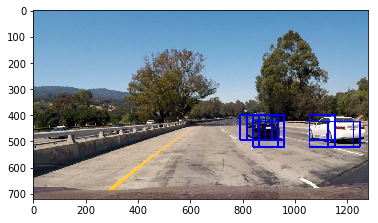

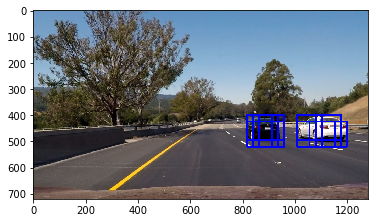

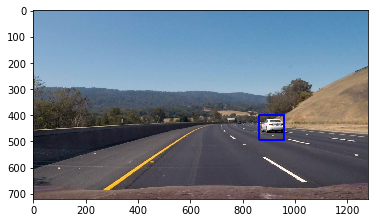

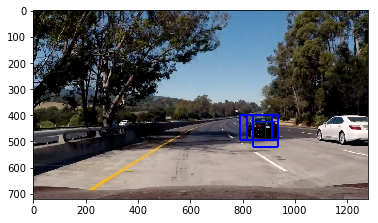

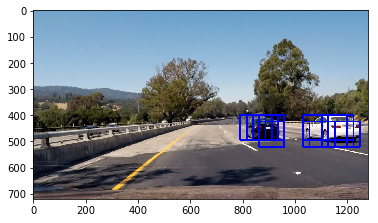

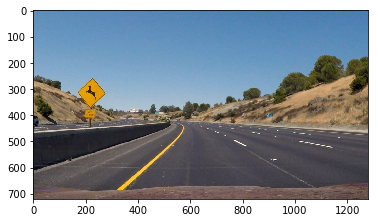

In [13]:
%matplotlib inline


ystart = 400
ystop = 656
scale = 1.5 #shrink image by this factor for speedier classification and to shrink the window size


# test on an individual subsection of the image
"""
image = mpimg.imread('./test_images/test1.jpg').astype(np.float32) / 255
sub_image = image[400:495, 820:915]
print(sub_image[0,0])
#sub_image = image[385:515, 815:945]
#print(sub_image[0, 0])

plt.imshow(sub_image)
plt.figure()


extractor = FeatureExtractor(sub_image)
converted = extractor.color_converted_image()
print(converted[0][0])
sub_image_features = FeatureExtractor(sub_image).combined_features()
scaled = X_scaler.transform(sub_image_features.reshape(1, -1))
prediction = model.predict(scaled)
print("prediction is {}".format(prediction))
"""

# verify on a known car image
"""
image = mpimg.imread('./examples/53.png')
print(image[0][0])
features = FeatureExtractor(image).combined_features()
scaled = X_scaler.transform(features.reshape(1, -1))
prediction = model.predict(scaled)
print("prediction is {}".format(prediction))
"""


# test on each of the test images
for filename in glob.glob('./test_images/*.jpg'):
    img = mpimg.imread(filename)

    bboxes = find_cars(img, ystart, ystop, scale, model, X_scaler, 9, 8, 2)
    box_image = draw_bboxes(img, bboxes)
    
    #print(box_image.shape)

    plt.figure()
    plt.imshow(box_image)

In [14]:
from scipy.ndimage.measurements import label
from moviepy.editor import VideoFileClip
from IPython.display import HTML


class MovieProcessor:
    
    def __init__(self, input_filename, output_filename, max_length=None):
        self.output_filename = output_filename
        self.clip = VideoFileClip(input_filename)
        self.max_length = max_length
        self.heatmap = None
        
    def process(self):
        subclip = self.clip.fl_image(self.pipeline)
        if self.max_length is not None:
            subclip = subclip.subclip(0, self.max_length)

        %time subclip.write_videofile(self.output_filename, audio=False)
        
    def pipeline(self, image):
        self._init_heatmap(image)
        
        bboxes = find_cars(image, ystart, ystop, scale, model, X_scaler, 9, 8, 2)
        
        self.add_heat(bboxes)
        self.apply_threshold(1)
        self.decay_heatmap()
        
        labels = label(self.heatmap)
        draw_img = self.draw_labeled_bboxes(image, labels)
        
        return draw_img
        
        
    def add_heat(self, bbox_list):
        # Iterate through list of bboxes
        for box in bbox_list:
            # Add += 1 for all pixels inside each bbox
            # Assuming each "box" takes the form ((x1, y1), (x2, y2))
            self.heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

        # Return updated heatmap
        return self.heatmap

    def apply_threshold(self, threshold):
        # Zero out pixels below the threshold
        self.heatmap[self.heatmap <= threshold] = 0
        # Return thresholded map
        return self.heatmap
    
    def decay_heatmap(self):
        self.heatmap *= 0.8

    def draw_labeled_bboxes(self, img, labels):
        # Iterate through all detected cars
        for car_number in range(1, labels[1] + 1):
            # Find pixels with each car_number label value
            nonzero = (labels[0] == car_number).nonzero()
            # Identify x and y values of those pixels
            nonzeroy = np.array(nonzero[0])
            nonzerox = np.array(nonzero[1])
            # Define a bounding box based on min/max x and y
            bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
            # Draw the box on the image
            cv2.rectangle(img, bbox[0], bbox[1], (0, 0, 255), 6)
        # Return the image
        return img   
        
    
    def _init_heatmap(self, image):
        if self.heatmap is None:
             self.heatmap = np.zeros_like(image[:,:,0]).astype(np.float)

                

In [ ]:
MovieProcessor('./project_video.mp4', './project_output.mp4').process()

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('./project_output.mp4'))

[MoviePy] >>>> Building video ./project_output.mp4
[MoviePy] Writing video ./project_output.mp4


100%|█████████▉| 1260/1261 [1:48:57<00:05,  5.19s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_output.mp4 

CPU times: user 1h 48min 58s, sys: 1.81 s, total: 1h 49min
Wall time: 1h 48min 58s


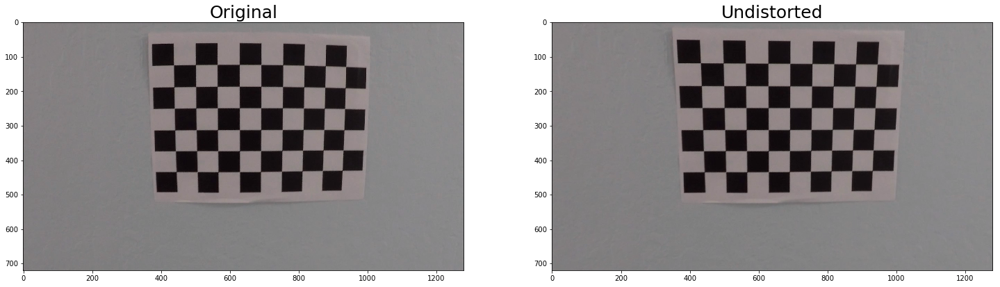

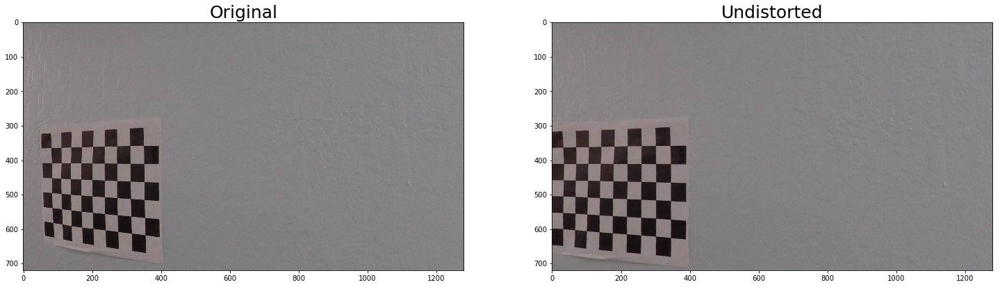

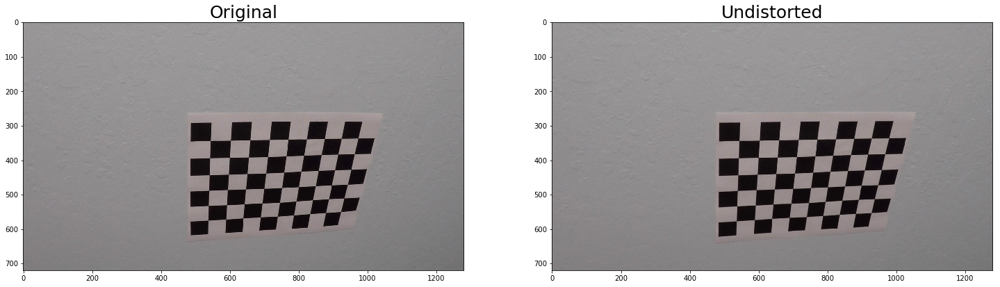

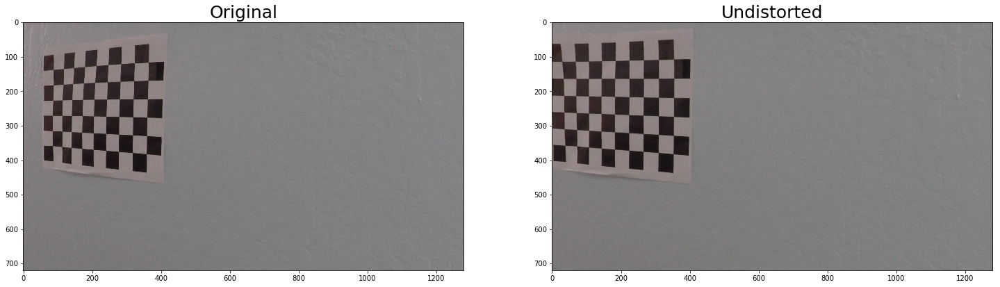

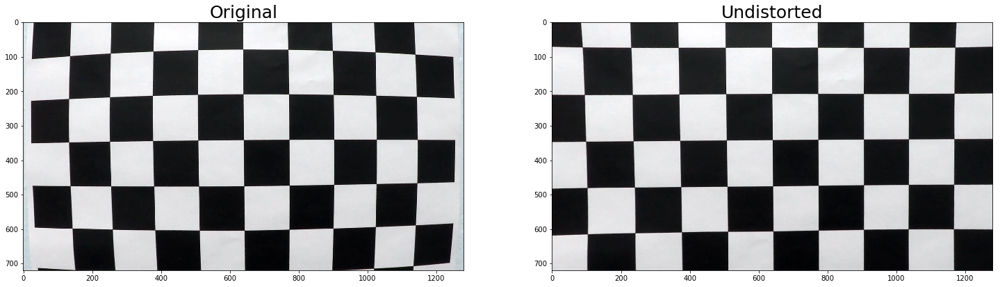

...

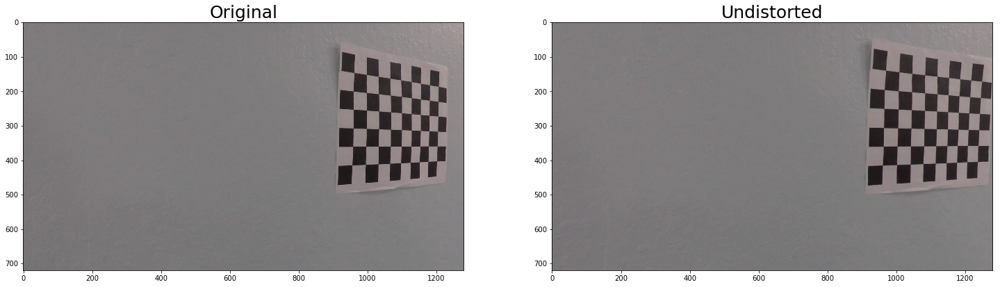

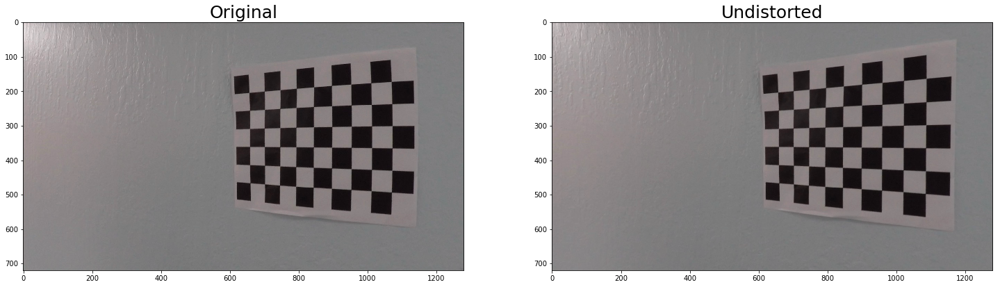

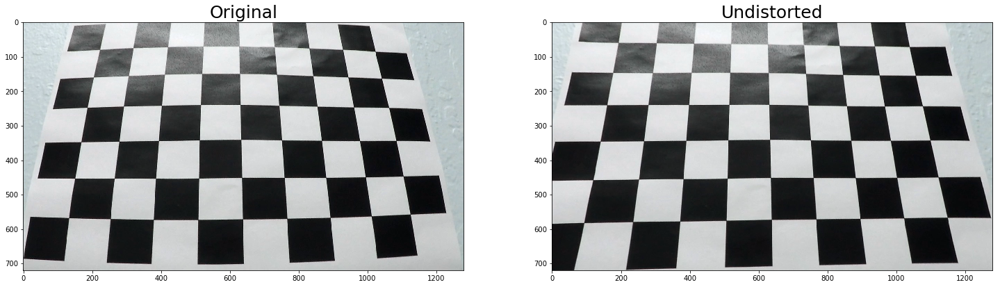

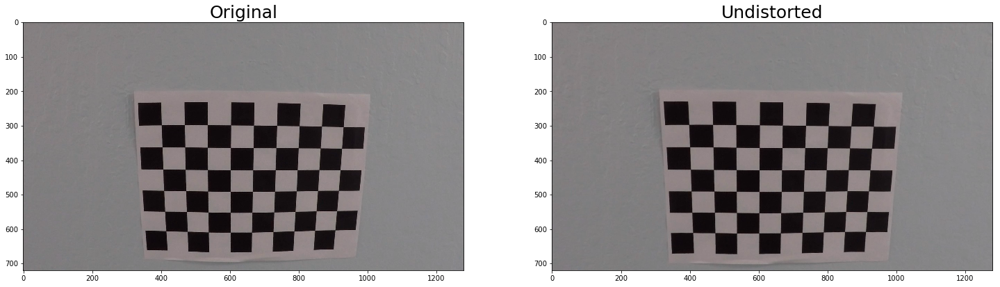

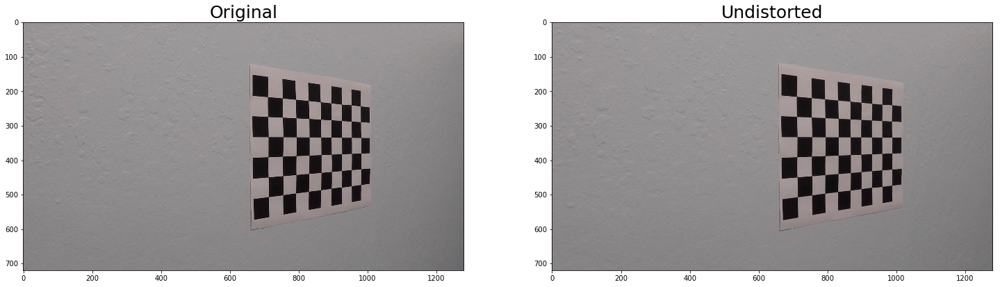

In [16]:
# combine with lane finding from https://github.com/gardenermike/finding-lane-lines-reprise/blob/master/lane_lines.ipynb

chessboard_columns = 9
chessboard_rows = 6


# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((chessboard_rows * chessboard_columns, 3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

def undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undist


def camera_calibration_data(grayscale_sample_image, objpoints, imgpoints):
    _ret, mtx, dist, _rvecs, _tvecs = cv2.calibrateCamera(
        objpoints,
        imgpoints,
        grayscale_sample_image.shape[::-1],
        None,
        None
    )
    
    return mtx, dist
        

# Step through the list of calibration images and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (chessboard_columns, chessboard_rows), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

# get calibration matrix based on all calibration images
calibration_mtx, calibration_dist = camera_calibration_data(gray, objpoints, imgpoints)

# show calibration images with undistortion applied
for fname in images:
    img = cv2.imread(fname)
    undistorted = undistort(img, calibration_mtx, calibration_dist)
    figure = plt.figure(fname)
    
    _, (ax1, ax2) = plt.subplots(1, 2, figsize=(25,10))
    ax1.imshow(img)
    ax1.set_title('Original', fontsize=25)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted', fontsize=25)

In [17]:
# convert RGB image to three new channels,
# reflecting a thresholded X gradient in the S and L channels,
# plus a thresholded S channel
def extract_features(img, s_thresh=(170, 255), sx_thresh=(40, 100)):
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(np.copy(img), cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    
    # Sobel x in L
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))
    
    # Threshold x gradient in L
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Sobel x in S
    S_sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    S_abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    S_scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    S_sxbinary = np.zeros_like(S_scaled_sobel)
    S_sxbinary[(S_scaled_sobel >= sx_thresh[0]) & (S_scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Stack sobel x in L, sobel x in S, and thresholded x
    color_binary = np.dstack((S_sxbinary, sxbinary, s_binary))
    
    gray_binary = np.zeros_like(scaled_sobel)
    gray_binary[(S_sxbinary == 1) | (sxbinary == 1) | (s_binary == 1)] = 1
    
    return color_binary, gray_binary

def mask_away_noise(img):

    """
    Removes the portion of the image unlikely to contain relevant lines
    """
    width = img.shape[1]
    height = img.shape[0]
    
    for y in range(height):
        for x in range(width):
            in_top_of_image = y < height * 0.6
            
            in_left_triangle = y < (height / -width) * 0.85 * x + height
            in_right_triangle = y < (height / width) * 0.85 * x + (height * (1 - 0.85))
            
            between_lanes = False
            if y > 0.7 * height:
                x_range = y - (0.7 * height)
                x_range *= 1.2
                if x > (width / 2) - x_range and x < (width / 2) + x_range:
                    between_lanes = True
            
            if in_top_of_image or in_left_triangle or in_right_triangle or between_lanes:
                img[y, x] = 0
    
    return img

In [18]:
def perspective_transform(image, inverse=False):
    image_width = image.shape[1]
    image_height = image.shape[0]
    image_shape = (image_width, image_height)
    
    x_offset = int(image_width * 0.14)
    y_offset = int(image_height * 0.65)
    horizon_y = int(image_height * 0.7)
    horizon_x = int(image_width * 0.5)
    inward_x_shift = 1.2
    starting_pixels_from_center = 5
    ending_pixels_from_center = 16.5
    
    src = np.float32([
        [horizon_x - starting_pixels_from_center, horizon_y],
        [horizon_x + starting_pixels_from_center, horizon_y],
        [x_offset, image_height],
        [image_width - x_offset, image_height]
    ])
    
    dst = np.float32([
        [horizon_x - ending_pixels_from_center, y_offset],
        [horizon_x + ending_pixels_from_center, y_offset],
        [x_offset * inward_x_shift, image_height],
        [image_width - x_offset * inward_x_shift, image_height]
    ])
    
    #print(src, dst)
    
    # get the perspective transform matrix M
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    #transform perspective
    if inverse:
        warped = cv2.warpPerspective(image, Minv, image_shape)
    else:
        warped = cv2.warpPerspective(image, M, image_shape)
    
    return warped

In [19]:
# function to extract centers of lines
def find_window_centroids(image, window_width, window_height, margin):
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # Sum slices of image
    ratio_denominator = 4
    image_width = image.shape[1]
    l_sum = np.sum(image[int((ratio_denominator - 1) * image.shape[0] / ratio_denominator):, :int(image_width * 0.4)], axis=0)
    l_center = np.argmax(np.convolve(window, l_sum)) - (window_width / 2)
    r_sum = np.sum(image[int((ratio_denominator - 1) * image.shape[0] / ratio_denominator):, int(image_width * 0.6):], axis=0)
    r_center = np.argmax(np.convolve(window, r_sum)) + (image_width * 0.6) - (window_width / 2)
    
    width = r_center - l_center
    #center = np.mean([r_center, l_center])
    
    # Add what we found for the first layer
    y = image.shape[0] - window_height / 2
    window_centroids.append(((l_center, y), (r_center, y)))
    
    # Go through each layer looking for max pixel locations
    level_count = (int)(image.shape[0] / window_height)
    for level in range(1, level_count):
        # convolve the window into the vertical slice of the image
        y_min = int(image.shape[0] - (level + 1) * window_height)
        y_max = int(image.shape[0] - level * window_height)
        
        # black out everything outside of reasonable boundaries
        last_l_min = window_centroids[-1][0][0] - window_width
        last_r_max = window_centroids[-1][1][0] + window_width
        image[y_min:y_max, 0:max(int(last_l_min), 0)] = 0
        image[y_min:y_max, min(int(last_r_max), image_width):image_width] = 0
        
        image_layer = np.sum(
            image[y_min:y_max, :],
            axis=0)

        
        conv_signal = np.convolve(window, image_layer)
        
        # Use window_width/2 as offset because convolution signal reference is at right side of window,
        # not center of window
        # reduce confidence at distance from vehicle
        offset = window_width / 2
        
        # Find the best left centroid by using past left center as a reference
        l_min_index = int(max(l_center + offset - margin, 0))
        l_max_index = int(min(l_center + offset + margin, image.shape[1]))
        if l_max_index > l_min_index:
            conv_range = conv_signal[l_min_index:l_max_index]
            if max(conv_range) > 50:
                l_center = np.argmax(conv_range) + l_min_index - offset
            else:
                l_center = (l_min_index + l_max_index) / 2
        else:
            l_center = l_min_index
        
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center + offset - margin, 0))
        r_max_index = int(min(r_center + offset + margin, image.shape[1]))
        if r_max_index > r_min_index:
            conv_range = conv_signal[r_min_index:r_max_index]
            if max(conv_range) > 50:
                r_center = np.argmax(conv_range) + r_min_index - offset
            else:
                r_center = (r_min_index + r_max_index) / 2
        else:
            r_center = r_min_index
        
        # sanity check for further-forward data. If the line suddenly changes directions,
        # suspect trouble
        if level > level_count * 0.6:
            l_diffs = []
            r_diffs = []
            for past_level in range(len(window_centroids) - 1):
                start_level = window_centroids[past_level]
                next_level = window_centroids[past_level + 1]
                l_diff = next_level[0][0] - start_level[0][0]
                r_diff = next_level[1][0] - start_level[1][0]
                l_diffs.append(l_diff)
                r_diffs.append(r_diff)
            
            l_diff_sum = np.sum(l_diffs)
            r_diff_sum = np.sum(r_diffs)
            
            current_l_diff = l_center - window_centroids[-1][0][0]
            current_r_diff = r_center - window_centroids[-1][1][0]
            
            l_diff_deviated = (((current_l_diff > 0 and l_diff_sum < 0) or
                (current_l_diff < 0 and l_diff_sum > 0)) and
                np.abs(current_l_diff) > 20)
                
            r_diff_deviated = (((current_r_diff > 0 and r_diff_sum < 0) or
                (current_r_diff < 0 and r_diff_sum > 0)) and
                np.abs(current_r_diff) > 20)
                
            if l_diff_deviated:
                l_center = (window_centroids[-1][0][0] +
                    (window_centroids[-1][0][0] - window_centroids[0][0][0]) / (level - 1))
                
            if r_diff_deviated:
                r_center = (window_centroids[-1][1][0] +
                    (window_centroids[-1][1][0] - window_centroids[3][1][0]) / (level - 1))
                
        
        # force equal lane width / parallel lanes
        new_center = np.mean([l_center, r_center])
        l_center = new_center - (width / 2)
        r_center = new_center + (width / 2)
                
        
        # Add what we found for that layer
        y = image.shape[0] - window_height / 2 - level * window_height
        window_centroids.append(((l_center, y), (r_center, y)))

    return window_centroids

In [20]:

# Fit a second order polynomial to the passed-in centroids
def find_curve(points, x_scale=1, y_scale=1):
    #extract x and y from points
    xs = [point[0] * x_scale for point in points]
    ys = [point[1] * y_scale for point in points]
    
    # y as a function of x, which makes plotting easier
    return np.polyfit(ys, xs, 2)

In [21]:
def find_curves(centroids, x_scale=1, y_scale=1):
    left_points = [centroid[0] for centroid in centroids]
    right_points = [centroid[1] for centroid in centroids]
    
    left_curve = find_curve(left_points, x_scale, y_scale)
    right_curve = find_curve(right_points, x_scale, y_scale)
    
    #print(left_curve, right_curve)
    
    return left_curve, right_curve

In [22]:
def evaluate_curve_function(value, curve):
    return curve[0] * value**2 + curve[1] * value + curve[2]

# overlay an image on another
def weighted_img(img, initial_img, α=0.98, β=1., λ=0.):
    """
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

def plot_curves(img, curves):
    height = img.shape[0]
    width = img.shape[1]
    left_curve, right_curve = curves
    y_coordinates = np.linspace(0, height - 1, num=height)
    
    left_x_coordinates = [evaluate_curve_function(y, left_curve) for y in y_coordinates]
    right_x_coordinates = [evaluate_curve_function(y, right_curve) for y in y_coordinates]
    
    x_ranges = [sorted(item) for item in zip(left_x_coordinates, right_x_coordinates)]
    
    overlay = np.zeros_like(img)
    for y in range(height):
        left_x = int(np.round(left_x_coordinates[y]))
        right_x = int(np.round(right_x_coordinates[y]))
        if left_x >= 0 and left_x < width:
            overlay[y, max(left_x, 0):max(left_x + 20, 0), 0] = 255 # left red line
        if right_x >= 0 and right_x < width:
            overlay[y, min(right_x - 20, width):min(right_x, width), 0] = 255 # right red line
        
        if left_x < width and right_x > 0:
            overlay[y, max(left_x, 0):min(right_x, width), 1] = 255 # center green field
        
    return overlay

In [23]:
# struct-type object to hold details about curve
class Curve():
    def __init__(self):
        # was the line detected in the last iteration?
        self.steps_since_detected = 0
        
        # polynomial coefficients for the curve
        self.coefficients = []
        
        self.radius_of_curvature = 0
        
        # distance in meters of vehicle center from the line
        self.line_base_pos = None
        
        self.centroids = None

In [32]:
left_curve = Curve()
right_curve = Curve()
past_weight = 0.8

def get_curve_radius(coefficients, scale):
    max_y = 720 - 1
    return ((1 + (2 * coefficients[0] * max_y * scale + coefficients[1])**2)**1.5) / np.absolute(2 * coefficients[0])

def get_curve_radii(centroids):
    # Define conversions in x and y from pixels space to meters (very approximate)
    ym_per_pix = 30 / 720 # meters per pixel in y dimension
    xm_per_pix = 3.7 / 850 # meters per pixel in x dimension
    
    coefficients = find_curves(centroids, xm_per_pix, ym_per_pix)
    
    left_radius = get_curve_radius(coefficients[0], ym_per_pix)
    right_radius = get_curve_radius(coefficients[1], ym_per_pix)

    return left_radius, right_radius

def get_distances_from_center(coefficients):
    left_coefficients, right_coefficients = coefficients
    max_y = 720 - 1
    
    left_center = evaluate_curve_function(max_y, left_coefficients)
    right_center = evaluate_curve_function(max_y, right_coefficients)
    
    xm_per_pixel = 3.7 / 850 # this is approximate, and calculated sort of empirically
    
    x_center = 1280 / 2
    
    lane_center = np.mean([left_center, right_center])
    
    distance_from_lane_center = (x_center - lane_center) * xm_per_pixel
    
    left_pixel_distance = x_center - left_center
    right_pixel_distance = right_center - x_center
    
    left_meter_distance = left_pixel_distance * xm_per_pixel
    right_meter_distance = right_pixel_distance * xm_per_pixel
    
    return left_meter_distance, right_meter_distance, distance_from_lane_center

def save_curve(curve, coefficients, radius, distance, centroids):
    # anything below 600 is not a regulation road
    # and too much deviation means the data is bad
    """if radius < 600 or (curve.radius_of_curvature != 0 and np.absolute(curve.radius_of_curvature - radius) > 700):
        curve.steps_since_detected += 1
        #print('leaving!')
        return curve"""
    
    # deviation from the previous lane distance seems like a better check
    if curve.line_base_pos and np.abs(curve.line_base_pos - distance) > 0.5:
        curve.steps_since_detected += 1
        return curve
    
    curve.steps_since_detected = 0
    
    if len(curve.coefficients) == 0:
        curve.coefficients = coefficients
    else:
        curve.coefficients = curve.coefficients * past_weight + (1 - past_weight) * coefficients
        
    if curve.radius_of_curvature == 0:
        curve.radius_of_curvature = radius
    else:
        curve.radius_of_curvature = curve.radius_of_curvature * past_weight + (1 - past_weight) * radius
    
    if not curve.line_base_pos:
        curve.line_base_pos = distance
    else:
        curve.line_base_pos = curve.line_base_pos * past_weight + (1 - past_weight) * distance

    return curve
        
def save_curves(coefficients, radii, distances, centroids):
    global left_curve
    global right_curve
    left_curve = save_curve(left_curve, coefficients[0], radii[0], distances[0], centroids[0])
    right_curve = save_curve(right_curve, coefficients[1], radii[1], distances[1], centroids[1])
    
bbox_movie_processor = MovieProcessor('./test_video.mp4', None)

def process_image(img):
    img = undistort(img, calibration_mtx, calibration_dist)
    _, features = extract_features(img)
    features = mask_away_noise(features)
    preprocessed = perspective_transform(features)
    window_centroids = find_window_centroids(preprocessed, window_width, window_height, margin)
    
    coefficients = find_curves(window_centroids)
    radii = get_curve_radii(window_centroids)
    distances = get_distances_from_center(coefficients)
    save_curves(coefficients, radii, distances, window_centroids)
    
    overlay = plot_curves(img, (left_curve.coefficients, right_curve.coefficients))
    overlay = perspective_transform(overlay, True)
    
    vehicle_boxed_image = bbox_movie_processor.pipeline(img)
    
    combined = weighted_img(overlay, vehicle_boxed_image)
    # to visualize the preprocessed data, use these lines instead of the above line
    #three_channel_preprocessed = np.array(cv2.merge((preprocessed, preprocessed, preprocessed)), np.uint8) * 255
    #combined = weighted_img(three_channel_preprocessed, img, α=0.5)
    
    left_lane_text = "Left: radius {}, distance {}".format(
        np.round(left_curve.radius_of_curvature, 2),
        np.round(left_curve.line_base_pos, 2)
    )
    right_lane_text = "Right: radius {}, distance {}".format(
        np.round(right_curve.radius_of_curvature, 2),
        np.round(right_curve.line_base_pos, 2)
    )
    center_text = "Distance from lane center: {}".format(np.round(distances[2], 2))
    cv2.putText(combined, left_lane_text, (20, 35), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 100, 100), 3)
    cv2.putText(combined, right_lane_text, (20, 65), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 100, 100), 3)
    cv2.putText(combined, center_text, (20, 95), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 100, 100), 3)
    
    return combined

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

image_size = (720, 1280)
window_width = image_size[1] // 20
window_height = image_size[0] // 9 # Break image into 9 vertical layers since image height is 720
margin = window_width * 2 # How much to slide left and right for searching

left_curve = Curve()
right_curve = Curve()
past_weight = 0.8


# process video
previous_curves = []
video_output = './project_video_output.mp4'
clip = VideoFileClip("./project_video.mp4")
processed_clip = clip.fl_image(process_image) #.subclip(0, 0.5) # a subclip can be used for quick testing

%time processed_clip.write_videofile(video_output, audio=False)


HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

[MoviePy] >>>> Building video ./project_video_output.mp4
[MoviePy] Writing video ./project_video_output.mp4


100%|█████████▉| 1260/1261 [2:05:33<00:05,  5.97s/it] 


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_video_output.mp4 

CPU times: user 2h 5min 53s, sys: 20.3 s, total: 2h 6min 13s
Wall time: 2h 5min 34s
